# Group Project - Machine Learning II

- Other Feature Selection
- Multiclass for algorithms


## Preparation

### Import Libraries

In [91]:
#Basic
import pandas as pd
import numpy as np
import re
import itertools
from pandas_profiling import ProfileReport

#Plotting
import seaborn as sns
from matplotlib import pyplot as plt
import graphviz

#Herarchy
import scipy.cluster.hierarchy as sch


#Sklearn workflow
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import RFE, SelectFromModel,SelectKBest, chi2
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold,GridSearchCV
from sklearn.metrics import  accuracy_score, confusion_matrix, precision_score, recall_score
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from sklearn.covariance import EllipticEnvelope
from sklearn.pipeline import make_pipeline


#Models
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import MultinomialNB,BernoulliNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier

In [4]:
#Formatting
pd.set_option( "display.max_columns", None,'display.max_colwidth', None)

### Read Files

In [5]:
data = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [6]:
#Auxiliar DataFrames explained in feeature creation part
soil_help = pd.read_excel('types_soil.xlsx')
soil_help2 = pd.read_excel('types_soil.xlsx',sheet_name=1)

## Feature Understanding

### Preliminary

In [7]:
#Eliminate unnecesary columns
data.drop(columns = ["Id"], inplace=True)

data.head(3)

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2


In [8]:
#Understand Columns
print(f'shape = {data.shape}')
print(data.info())

#There are no Null values in the dataset!

shape = (15120, 55)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15120 entries, 0 to 15119
Data columns (total 55 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   Elevation                           15120 non-null  int64
 1   Aspect                              15120 non-null  int64
 2   Slope                               15120 non-null  int64
 3   Horizontal_Distance_To_Hydrology    15120 non-null  int64
 4   Vertical_Distance_To_Hydrology      15120 non-null  int64
 5   Horizontal_Distance_To_Roadways     15120 non-null  int64
 6   Hillshade_9am                       15120 non-null  int64
 7   Hillshade_Noon                      15120 non-null  int64
 8   Hillshade_3pm                       15120 non-null  int64
 9   Horizontal_Distance_To_Fire_Points  15120 non-null  int64
 10  Wilderness_Area1                    15120 non-null  int64
 11  Wilderness_Area2                    15120 non-n

In [9]:
data.describe()
#Soiltype15 and 7 do not have values but are present in the test set

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.0,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.0,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,2749.322553,156.676653,16.501587,227.195701,51.076521,1714.023214,212.704299,218.965608,135.091997,1511.147288,0.237897,0.033003,0.419907,0.309193,0.023479,0.041204,0.063624,0.055754,0.010913,0.042989,0.0,0.000066,0.000661,0.141667,0.026852,0.015013,0.031481,0.011177,0.0,0.007540,0.040476,0.003968,0.003042,0.009193,0.001058,0.022817,0.050066,0.016997,0.000066,0.003571,0.000992,0.000595,0.085384,0.047950,0.021958,0.045635,0.040741,0.001455,0.006746,0.000661,0.002249,0.048148,0.043452,0.030357,4.000000
std,417.678187,110.085801,8.453927,210.075296,61.239406,1325.066358,30.561287,22.801966,45.895189,1099.936493,0.425810,0.178649,0.493560,0.462176,0.151424,0.198768,0.244091,0.229454,0.103896,0.202840,0.0,0.008133,0.025710,0.348719,0.161656,0.121609,0.174621,0.105133,0.0,0.086506,0.197080,0.062871,0.055075,0.095442,0.032514,0.149326,0.218089,0.129265,0.008133,0.059657,0.031482,0.024391,0.279461,0.213667,0.146550,0.208699,0.197696,0.038118,0.081859,0.025710,0.047368,0.214086,0.203880,0.171574,2.000066
min,1863.000000,0.000000,0.000000,0.000000,-146.000000,0.000000,0.000000,99.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2376.000000,65.000000,10.000000,67.000000,5.000000,764.000000,196.000000,207.000000,106.000000,730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,2752.000000,126.000000,15.000000,180.000000,32.000000,1316.000000,220.000000,223.000000,138.000000,1256.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,3104.00000

### Pandas Report

In [10]:
ProfileReport(data, minimal=False)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Create list of columns
In the dataset we divided the columns in 4:Target, Numeric, Area and Soil.

In [11]:
target = list(data.columns[data.columns=='Cover_Type'])
area =list(data.columns[data.columns.str.contains('Area')])
soil = list(data.columns[data.columns.str.contains('Soil')])
numeric = list(data.columns[0:10])

### Understand Numeric Columns

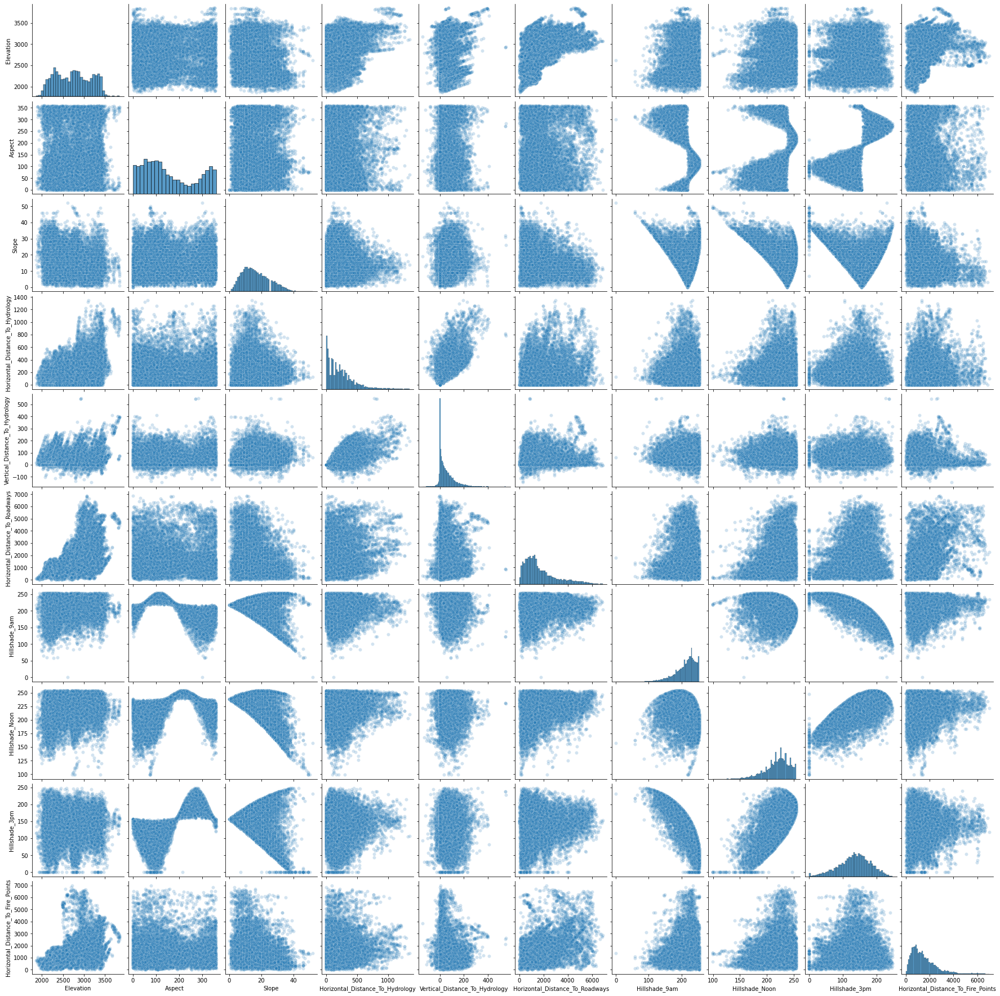

In [12]:
%matplotlib inline
sns.pairplot(data.loc[:,numeric],kind="scatter", plot_kws=dict( alpha=0.2))

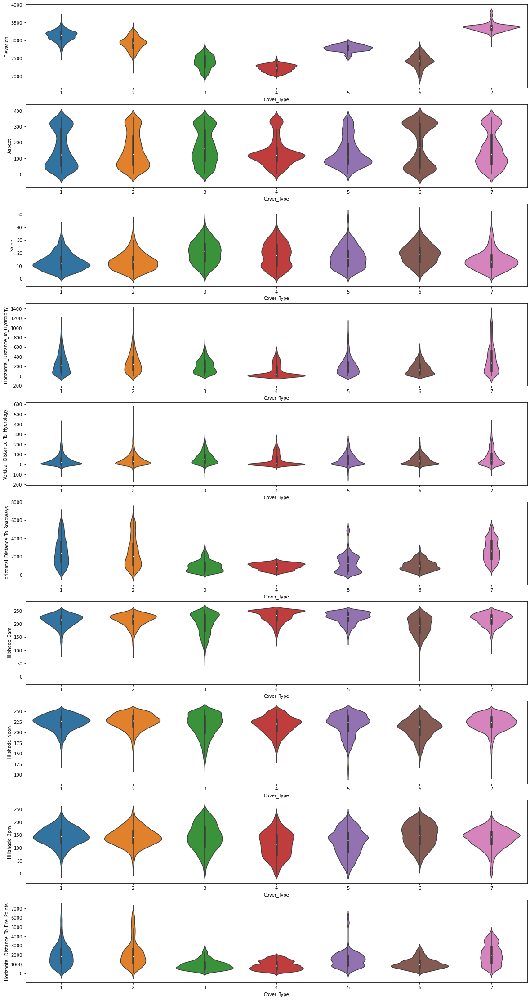

In [13]:
#Cover_type vs Numeric
fig, ax = plt.subplots(len(numeric),1,figsize =(20,40))
ax =ax.ravel()
for splt, col in zip(ax,numeric):
    sns.violinplot( x= target[0] ,y = col,data =data, ax=splt)

### Understanding Area Columns

In [14]:
#Melt area and soil
col_area = data.reset_index().melt(id_vars='index',value_vars=area)
data['Area'] = col_area.loc[col_area['value']==1,['variable','index']].sort_values('index').set_index('index')
data['Area'] = data['Area'].str.replace("Wilderness_Area","").astype('int')

col_area = data.reset_index().melt(id_vars='index',value_vars=soil)
data['Soil'] = col_area.loc[col_area['value']==1,['variable','index']].sort_values('index').set_index('index')
data['Soil'] = data['Soil'].str.replace("Soil_Type","").astype('int')

<AxesSubplot:xlabel='Cover_Type', ylabel='Area'>

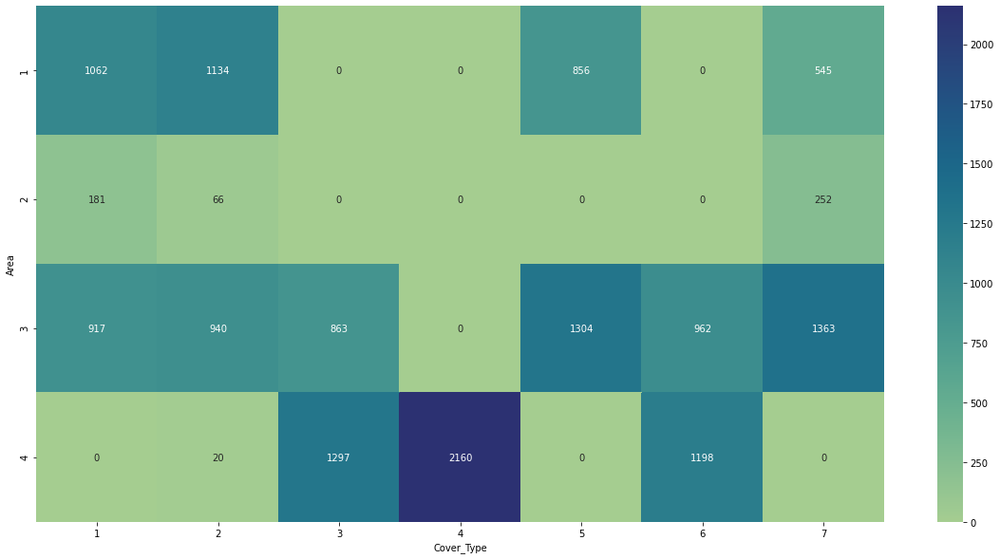

In [15]:
target_area = pd.pivot_table(data,index = 'Area',values = 'Soil', columns = target[0], aggfunc='count')
target_area.fillna(0,inplace = True)
fig = plt.subplots(figsize =(20,10))
sns.heatmap(target_area, annot=True,fmt='g', cmap ='crest')

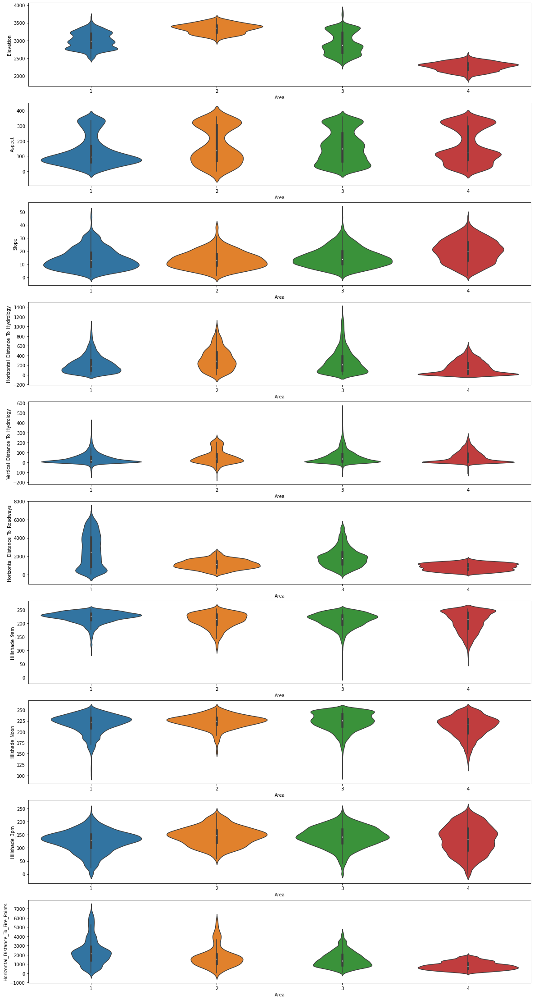

In [16]:
#Area vs Numeric
fig, ax = plt.subplots(len(numeric),1,figsize =(20,40))
ax =ax.ravel()
for splt, col in zip(ax,numeric):
    sns.violinplot( x= 'Area' ,y = col,data =data, ax=splt)

### Understanding Soil Columns

<AxesSubplot:xlabel='Cover_Type', ylabel='Soil'>

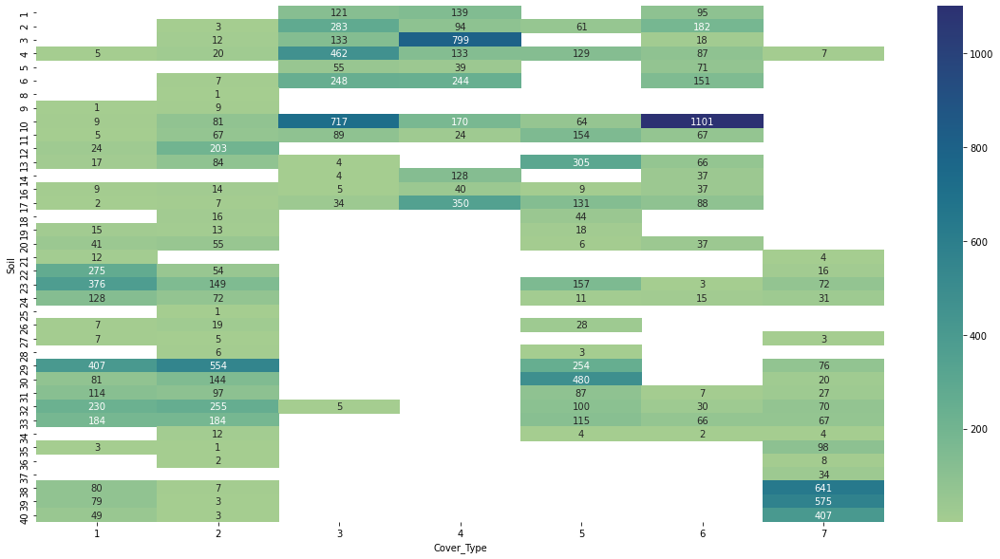

In [17]:
#Soil vs Target
target_soil = pd.pivot_table(data,index = 'Soil',values = 'Area', columns = target[0], aggfunc='count')
target_soil.fillna(0)
fig = plt.subplots(figsize =(20,10))
sns.heatmap(target_soil, annot=True,fmt='g', cmap ='crest')

### Findings

1) Elevation looks as a good feature for our model, because it diferentiates different cover types.

2) The reason of the 3 peak distribution of elevation is the different 3 heights where the cover types are

3) The reason of the second peak in the distribution of Aspect is because values are from 0 to 360 and means directions, in this case That means the majority of the slopes are looking to the north and east. we will introduce features represnting directions

4) Slope and Aspect created special scatterplotts when plotted against hillshades:
    - Slope against hillshade: when slope is 0 there is an specific value for each of the 3 hillshades and is if the sun is there or not the values of hillshade will increase or decrease
    
    - Aspect against Hillshade: It shows the movement of the sun and how impacts the shades of the slopes. the value of hillshade when slope is 0 makes a differentiation between places with sun and without sun
    

5) Area and soil also looks as good predictors differentiating some cover types

## Feature Creation

### Base Model to Compare

In [18]:
X = data.drop(columns = [target[0], 'Soil','Area'])
y = data[target[0]]

pipe = make_pipeline(MinMaxScaler(),DecisionTreeClassifier(random_state=42))

acc_base_model = np.mean(cross_val_score(pipe, X, y, cv=5, scoring= "accuracy"))
print(f"accuracy = {acc_base_model:.2}")

accuracy = 0.71


### Outlier Detection

<AxesSubplot:xlabel='value', ylabel='variable'>

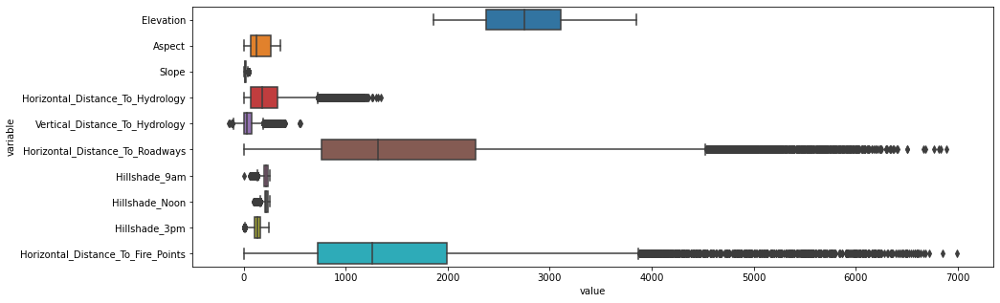

In [19]:
#Cover_type vs Numeric
fig= plt.subplots(figsize =(15,5))
sns.boxplot( x= 'value' ,y = 'variable',data = pd.melt(data[numeric]))

In [20]:
for outlier_detector in [IsolationForest(), EllipticEnvelope(), LocalOutlierFactor()]:

    yhat = outlier_detector.fit_predict(X[numeric])

    # select all rows that are not outliers
    mask = yhat != -1
    X_without_outliers, y_withouth_outliers = X.iloc[mask, :], y[mask]
    num_outliers = len(y)-len(y_withouth_outliers)
    print(f'num outliers detected: {num_outliers}')
    acc = np.mean(
        cross_val_score(
            pipe, 
            X_without_outliers, 
            y_withouth_outliers, 
            cv=5, 
            scoring= "accuracy"
          )
      )
    print(f"accuracy = {acc:.2}")

num outliers detected: 2625
accuracy = 0.7
num outliers detected: 1512
accuracy = 0.71
num outliers detected: 89
accuracy = 0.7


Because the outlier detection is not helping the model, we will mantain the outliers. Also as seen in the chart the outliers of the data are not that crazy

### Area encoding

<AxesSubplot:xlabel='Elevation', ylabel='Horizontal_Distance_To_Roadways'>

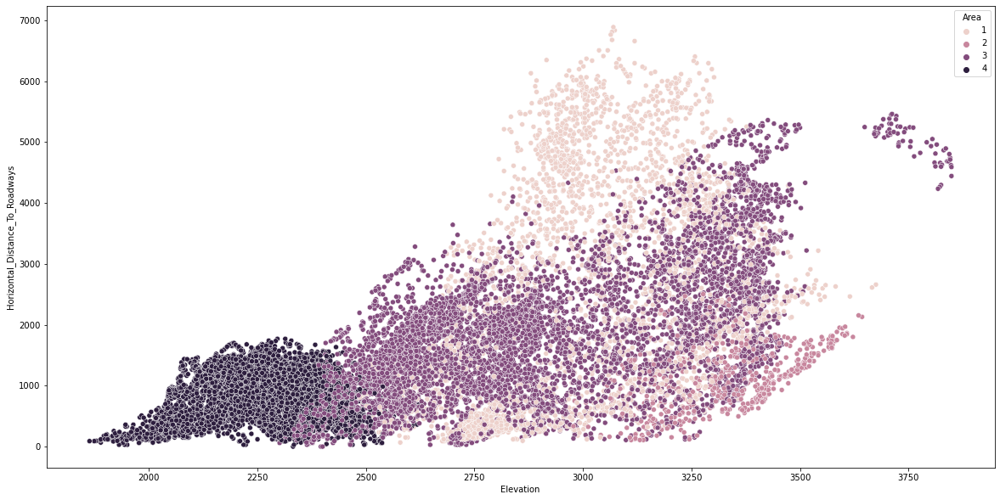

In [21]:
figsize = plt.subplots(figsize=(20,10))
sns.scatterplot(data = data,x="Elevation", y='Horizontal_Distance_To_Roadways',hue='Area' )

In [22]:
data['Area_num'] = data['Elevation']*data['Horizontal_Distance_To_Roadways']

pivoted = data.pivot_table(index='Area',values = 'Area_num',aggfunc='mean').reset_index()
pivoted = pd.merge(data[['Area']],pivoted)
data['Area_num'] = pivoted['Area_num']


### Combine Area with Soil

because area and soil look as good predictors we will try to combine them

In [23]:
data[['Area','Soil']]

,Area,Soil
0,1,29
1,1,29
2,1,12
3,1,30
4,1,29
...,...,...
15115,3,4
15116,3,4
15117,3,4
15118,3,4


<AxesSubplot:xlabel='Cover_Type', ylabel='Area_soil'>

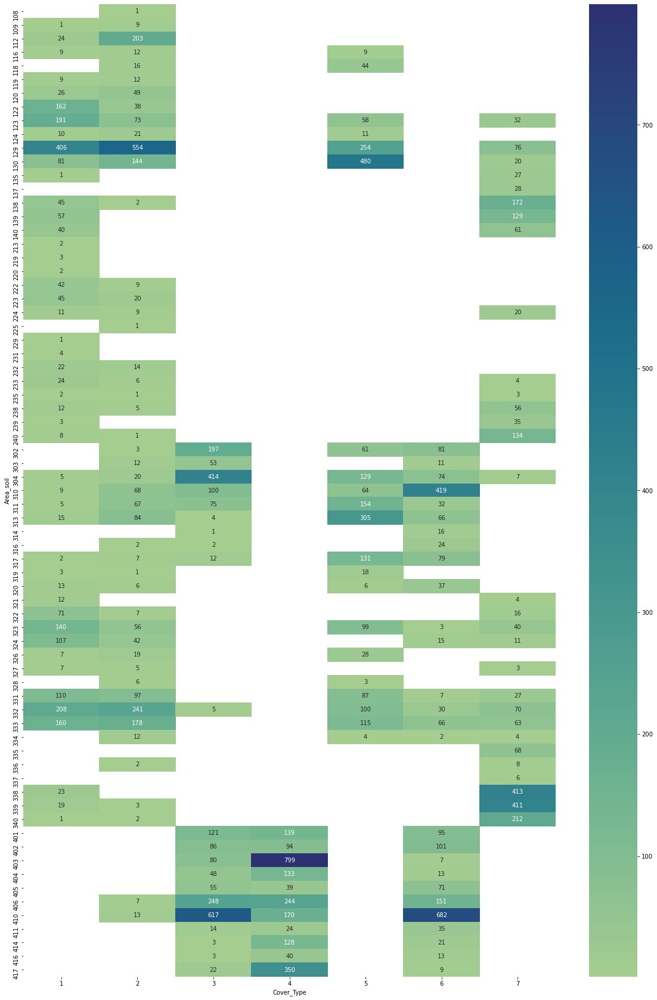

In [24]:
#Soil_Area vs Target
data['Area_soil'] = data['Area']*100+data['Soil']
target_soil = pd.pivot_table(data,index = 'Area_soil',values = 'Area', columns = target[0], aggfunc='count')
target_soil.fillna(0)
fig = plt.subplots(figsize =(20,30))
sns.heatmap(target_soil, annot=True,fmt='g', cmap ='crest')

### Area_soil dummies

In [25]:
area_soil =  pd.get_dummies(data['Area_soil'])
data = pd.concat([data,area_soil],axis=1)


### Create Columns of soil characteristics

In the Kaggle webpage there is information about the soil, we will used to find if those are good predictors of cover type

In [26]:
soil_help = soil_help.drop(columns=['Name','type 1','type 2', 'type 3'])

soil_help.head()

,Soil,type_soil,type_soil_num,soil_extremely_stony,soil_very_stony,soil_rubbly,soil_stony
0,1,extremely_stony,4,1,0,0,0
1,2,very_stony,3,0,1,0,0
2,3,rubbly,1,0,0,1,0
3,4,rubbly,1,0,0,1,0
4,5,rubbly,1,0,0,1,0


In [27]:
data = pd.merge(data,soil_help, how='left')

<AxesSubplot:xlabel='Cover_Type', ylabel='type_soil_num'>

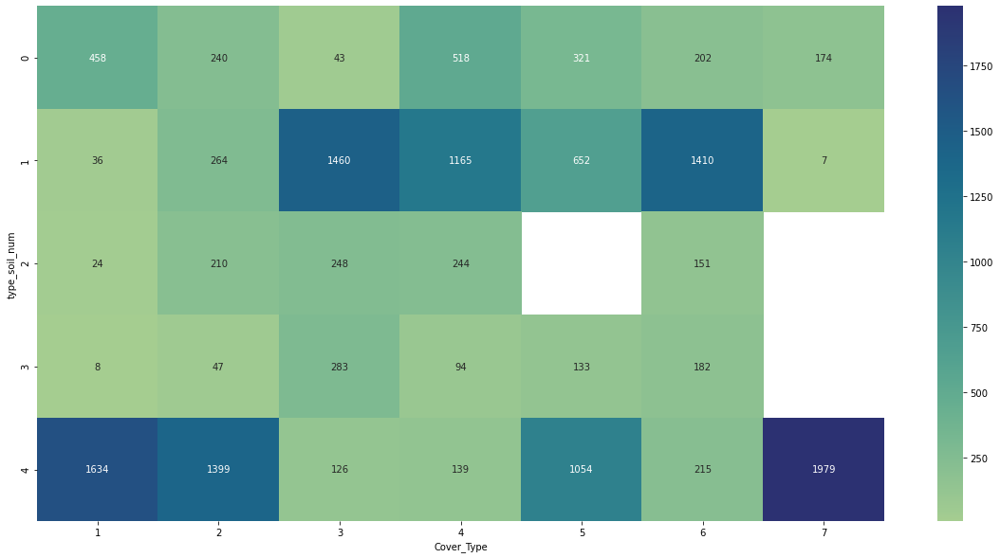

In [28]:
#Looking if charasterictics like rubby and stony are good predeictors
target_soil = pd.pivot_table(data,index = 'type_soil_num',values = 'Area', columns = target[0], aggfunc='count')
target_soil.fillna(0)
fig = plt.subplots(figsize =(20,10))
sns.heatmap(target_soil, annot=True,fmt='g', cmap ='crest')

In [29]:
#Soil Families
soil_help2 = soil_help2.drop(columns=['Name','type 1','type 2', 'type 3'])

soil_help2.head()

,Soil,soil_aquolis,soil_borohemists,soil_bross,soil_bullwark,soil_catamount,soil_cathedral,soil_como,soil_cryaquepts,soil_cryaquolis,soil_cryoborolis,soil_cryorthents,soil_cryumbrepts,soil_gateview,soil_gothic,soil_granile,soil_haploborolis,soil_legault,soil_leighcan,soil_limber,soil_moran,soil_pachicargiborolis,soil_ratake,soil_rockland,soil_rockoutcrop,soil_rogert,soil_supervisor,soil_tillsubastrum,soil_troutville,soil_vanet,soil_wetmore
0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
2,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
4,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0


In [30]:
data = pd.merge(data,soil_help2,how = 'left')

### Create columns taking account moment of sun

In [31]:
id_min = data['Slope'].min()
hills = ['Hillshade_Noon','Hillshade_3pm','Hillshade_9am']
hills_name = ['Sun_Noon','Sun_3pm','Sun_9am']
slope_sun = ['Slope_Noon','Slope_3pm','Slope_9am']
for hill,name,slope in zip(hills,hills_name,slope_sun):
    minimun = data.loc[id_min,hill]
    data[name] = [1 if dat>minimun else -1 for dat in data[hill]]
    data[slope] = data[name]*data['Slope']
 


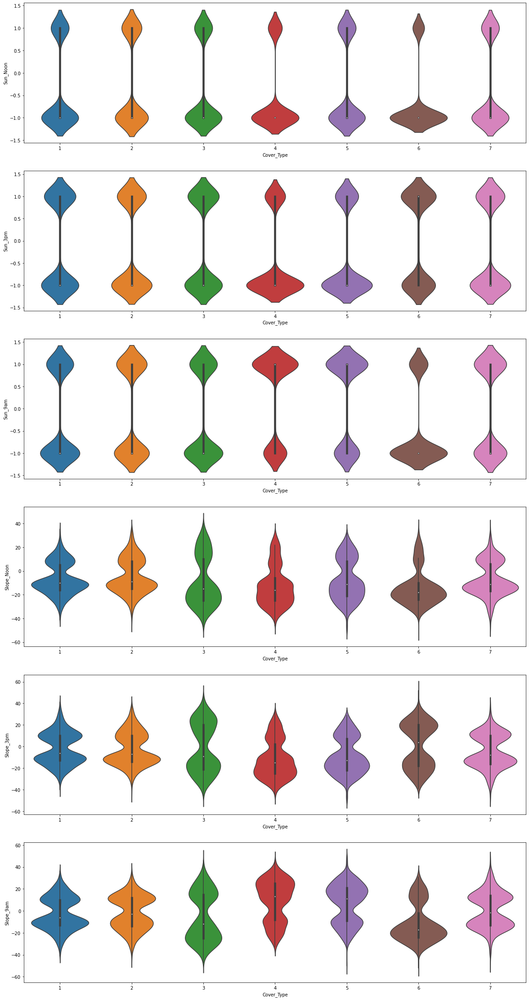

In [32]:
newmeric = hills_name+slope_sun
fig, ax = plt.subplots(len(newmeric),1,figsize =(20,40))
ax =ax.ravel()

for splt, col in zip(ax,newmeric):
    sns.violinplot( x= target[0] ,y = col,data =data, ax=splt)

### Create direct distance to water

<AxesSubplot:xlabel='Cover_Type', ylabel='Distance_To_Hydrology'>

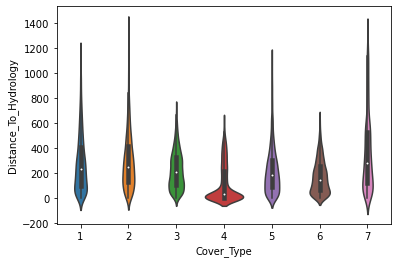

In [33]:
data['Distance_To_Hydrology'] = np.sqrt(data['Horizontal_Distance_To_Hydrology']**2+data['Vertical_Distance_To_Hydrology']**2)

sns.violinplot( x= target[0] ,y = 'Distance_To_Hydrology',data =data)

### Column for Cardinality of the slope

In [34]:
data.head(5)

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type,Area,Soil,Area_num,Area_soil,108,109,112,116,118,119,120,122,123,124,129,130,135,137,138,139,140,213,219,220,222,223,224,225,229,231,232,233,235,238,239,240,302,303,304,310,311,313,314,316,317,319,320,321,322,323,324,326,327,328,331,332,333,334,335,336,337,338,339,340,401,402,403,404,405,406,410,411,414,416,417,type_soil,type_soil_num,soil_extremely_stony,soil_very_stony,soil_rubbly,soil_stony,soil_aquolis,soil_borohemists,soil_bross,soil_bullwark,soil_catamount,soil_cathedral,soil_como,soil_cryaquepts,soil_cryaquolis,soil_cryoborolis,soil_cryorthents,soil_cryumbrepts,soil_gateview,soil_gothic,soil_granile,soil_haploborolis,soil_legault,soil_leighcan,soil_limber,soil_moran,soil_pachicargiborolis,soil_ratake,soil_rockland,soil_rockoutcrop,soil_rogert,soil_supervisor,soil_tillsubastrum,soil_troutville,soil_vanet,soil_wetmore,Sun_Noon,Slope_Noon,Sun_3pm,Slope_3pm,Sun_9am,Slope_9am,Distance_To_Hydrology
0,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,1,29,7.934324e+06,129,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,extremely_stony,4,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,-1,-3,-1,-3,-1,-3,258.000000
1,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,1,29,7.934324e+06,129,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,extremely_stony,4,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1,2,-1,-2,212.084889
2,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,12,7.934324e+06,112,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,stony,2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,9,-1,-9,1,9,275.769832
3,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,1,30,7.934324e+06,130,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,extremely_stony,4,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,18,-1,-18,1,18,269.235956
4,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,1,29,7.934324e+06,129,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,extremely_stony,4,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1,2,-1,-2,153.003268


In [35]:
cardinal = []
for val in data['Aspect']:
    if val <22.5:
        cardinal.append('North')
    elif val<67.5:
        cardinal.append('Northeast')
    elif val<112.5:
        cardinal.append('East')
    elif val<157.5:
        cardinal.append('Southeast')
    elif val< 202.5:
        cardinal.append('South')
    elif val< 247.5:
        cardinal.append('Southwest')
    elif val<292.5:
        cardinal.append('West')
    elif val <337.5:
        cardinal.append('Northwest')
    else:
        cardinal.append('North')
data['Cardinal']= cardinal
cardinal =  pd.get_dummies(cardinal)
data = pd.concat([data,cardinal],axis=1)


### Column for Cardinality of the slope (numeric)

In [36]:
cardinal2 = []
for val in data['Aspect']:
    if val <22.5:
        cardinal2.append(0)
    elif val<67.5:
        cardinal2.append(45)
    elif val<112.5:
        cardinal2.append(90)
    elif val<157.5:
        cardinal2.append(135)
    elif val< 202.5:
        cardinal2.append(180)
    elif val< 247.5:
        cardinal2.append(225)
    elif val<292.5:
        cardinal2.append(270)
    elif val <337.5:
        cardinal2.append(315)
    else:
        cardinal2.append(0)
data['Cardinal_num']= cardinal2


<AxesSubplot:xlabel='Cover_Type', ylabel='Cardinal'>

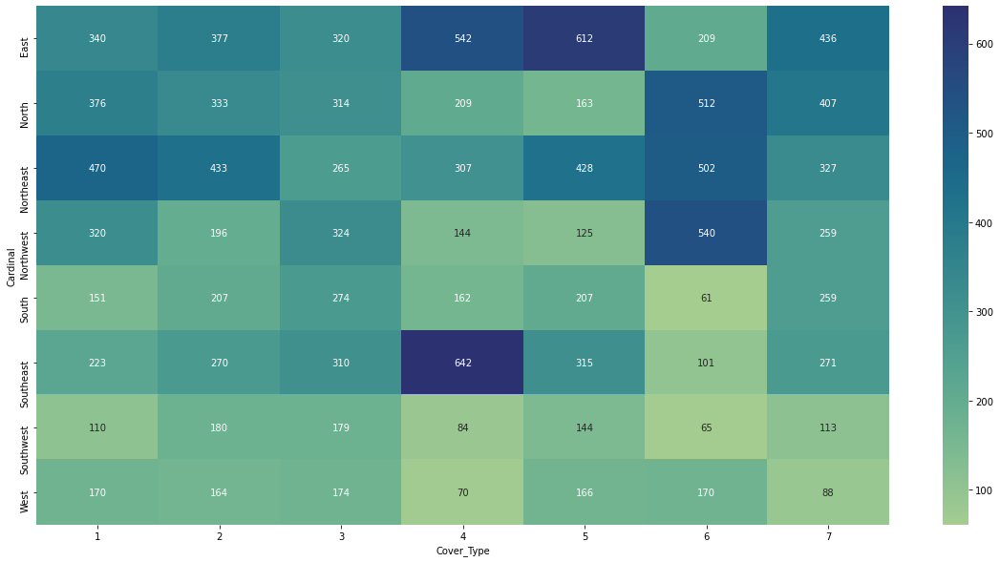

In [37]:
target_area = pd.pivot_table(data,index = 'Cardinal',values = 'Soil', columns = target[0], aggfunc='count')
target_area.fillna(0,inplace = True)
fig = plt.subplots(figsize =(20,10))
sns.heatmap(target_area, annot=True,fmt='g', cmap ='crest')

<AxesSubplot:xlabel='Cover_Type', ylabel='Cardinal_num'>

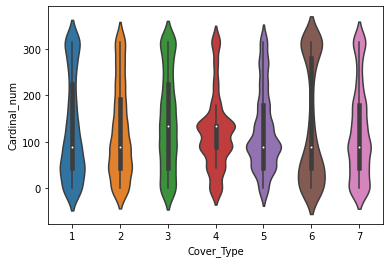

In [38]:
sns.violinplot( x= target[0] ,y = 'Cardinal_num',data =data)

### Absolute_Vertical_Distance_To_Hydrology

In [39]:
data['Abs_Vertical_Distance_To_Hydrology'] = abs(data['Vertical_Distance_To_Hydrology'])

### Values above or below water

In [40]:
data['above_below_water'] = [1 if val>=0 else 0 for val in data['Vertical_Distance_To_Hydrology'] ]

### Other Mathematical Creations 

In [41]:
data['Elev_to_Horizontal_Hyd']= (data['Elevation'] - data['Horizontal_Distance_To_Hydrology']) / 2
data['Elev_to_Horizontal_Road']= (data['Elevation'] - data['Horizontal_Distance_To_Roadways']) / 2 
data['Elev_to_Verticle_Hyd']= data['Elevation'] - data['Vertical_Distance_To_Hydrology'] 

data['Mean_Horizontal_Dist']= (data['Horizontal_Distance_To_Fire_Points'] + data['Horizontal_Distance_To_Hydrology'] + 
                                 data['Horizontal_Distance_To_Roadways'])/3 
data['Mean_Fire_Hydro']= (data['Horizontal_Distance_To_Fire_Points'] + data['Horizontal_Distance_To_Hydrology'])/2

### Features XX2

In [42]:
# from sklearn.preprocessing import PolynomialFeatures
# scaled = StandardScaler().fit_transform(data[numeric])
# scaled = pd.DataFrame(scaled,columns=numeric)

# poly = PolynomialFeatures(degree=2)
# multi = pd.DataFrame(poly.fit_transform(scaled), columns =poly.get_feature_names() )
# names = {'old':multi.columns[1:11],'new':numeric}
# cols = pd.Series(multi.columns)
# for i in range(0,len(numeric)):
#     cols = cols.str.replace(names['old'][i],names['new'][i])
# multi.columns = cols
# multi = multi.iloc[:,11:]
# data = pd.concat([data,multi],axis=1)

### Checking Coorelation

In [43]:
#find all numeric variables
describe = data.describe()
cols_numeric = []
cols_dummy = []
for col in list(describe.columns):
    #if (describe.loc['min',col]==0) and ((describe.loc['max',col]==0) or (describe.loc[min,col]==1)):
    if (describe.loc['min',col]==0) and ((describe.loc['max',col]==0) or (describe.loc['max',col]==1)):
        cols_dummy.append(col)
    else:
        cols_numeric.append(col)
        

<ipython-input-44-12812d859b4f>:18: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


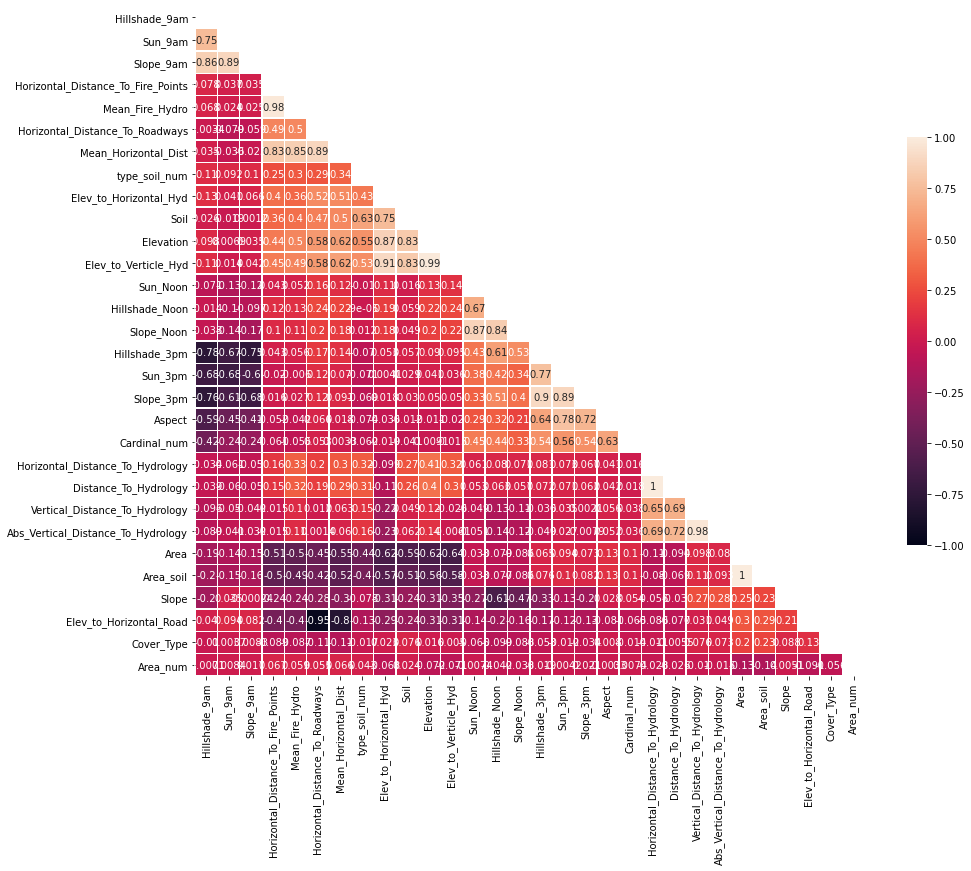

In [44]:
# Only select the requested columns
df_corr_matrix = data[cols_numeric]

# This computes the Pearson coefficient for all couples
corr = df_corr_matrix.corr().fillna(0)

# Generate features and distance matrix.
D = corr.values
# Compute and plot dendrogram.
Y = sch.linkage(D, method='centroid')
Z = sch.dendrogram(Y, orientation='right',no_plot=True)
# Compute distance matrix.
index = Z['leaves']
D = D[index,:]
D = D[:,index]

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
size = max(10, len(corr.columns)/2.)
f, ax = plt.subplots(figsize=(size, size))

# Draw the heatmap with the mask and correct aspect ratio

sns.heatmap(D, mask=mask, square=True, linewidths=.5, annot=True,cbar_kws={"shrink": 0.5}, ax=ax, vmin=-1,vmax=1)
#ax.set(xticks=range(len(corr.columns)), xticklabels=corr.columns[index], yticks=range(len(corr.columns)), yticklabels=reversed(corr.columns[index]))
ax.set_xticklabels(corr.columns[index], rotation=90, ha='center');
ax.set_yticklabels(corr.columns[index], rotation=0);

### Groups of correlated variables to put in a PCA

Although we try PCA to reduce correlation it didnt improve or results, so its commented

In [45]:
# #Correlated Groups

# group_hydro = ['Abs_Vertical_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology',
#               'Distance_To_Hydrology', 'Horizontal_Distance_To_Hydrology']


# group_elevation = ['Elev_to_Horizontal_Hyd', 'Elev_to_Horizontal_Road', 'Elev_to_Verticle_Hyd',
#                   'Elevation', 'Mean_Elevation_Vertical_Distance_Hydrology']

# group_shade = ['Aspect','Hillshade_3pm', 'Hillshade_9am', 'Slope_3pm', 'Slope_9am', 'Sun_9am',
#               'Hillshade_Noon', 'Slope_Noon', 'Sun_Noon', 'Slope_3pm', 'Sun_3pm']


# group_roads= ['Horizontal_Distance_To_Fire_Points', 'Horizontal_Distance_To_Roadways', 'Mean_Distance_Firepoints_Roadways', 
#           'Mean_Distance_Hydrology_Firepoints', 'Mean_Distance_Hydrology_Roadways', 'Mean_Fire_Hydro', 'Mean_Horizontal_Dist']

In [46]:
# corr_groups = [group_hydro,group_elevation,group_shade,group_roads]

# fig, ax = plt.subplots(2,2,figsize =(20,10))
# axes = ax.ravel()
# for group,ax in zip(corr_groups,axes):
#     scaled = StandardScaler().fit_transform(data[group])
#     scaled = pd.DataFrame(scaled,columns=group)
#     soil_pca = PCA().fit(scaled)
#     ax.bar(list(range(1,len(group)+1)),soil_pca.explained_variance_ratio_ )
#     ax.set_title(f' explained variance firts components {soil_pca.explained_variance_ratio_[0:2].sum():.2%}')

In [47]:
# #PCA
# corr_nums = [2,1,3,2]
# groups_names = [['hydro_pca1','hydro_pca2'],['elevation_pca1'],
#                ['shade_pca1','shade_pca2','shade_pca3'],['roads_pca1','roads_pca2']]

# for group,num,name in zip(corr_groups,corr_nums,groups_names):
#         scaled = StandardScaler().fit_transform(data[group])
#         scaled = pd.DataFrame(scaled,columns=group)
#         soil_pca = PCA(n_components = num).fit_transform(scaled)
#         soil_pca =  pd.DataFrame(soil_pca,columns=name)
#         data = pd.concat([data,soil_pca],axis=1)

## Feature Selection

### Organizing Data for feature Selection

In [48]:
categorical = list(data.columns[data.dtypes == 'object'])

In [49]:

ord_encoder_transformer = ColumnTransformer(
    [
        (
            "ordinal_encoder", 
            OrdinalEncoder(), 
            categorical
        )
    ], 
    remainder="drop"
)


In [50]:

ordinal_encoded_columns = pd.DataFrame(
    ord_encoder_transformer.fit_transform(data),
    columns= categorical
)

ordinal_encoded_columns.head()

,type_soil,Cardinal
0,0.0,2.0
1,0.0,2.0
2,3.0,5.0
3,0.0,5.0
4,0.0,2.0


In [51]:
for col in categorical:
    data[col] = ordinal_encoded_columns[col]

### Split Datset

In [52]:
#Seed
random = 42

In [53]:
# Data preparation
model = data.copy()
X = model.drop(columns=[target[0]])
y = model[target[0]]
y = y-1
X_train,X_test, y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=random)

### Find most important variables with everything

In [54]:
#Model with everything
clf = RandomForestClassifier(random_state=random)
clf.fit(X_train,y_train)

RandomForestClassifier(random_state=42)

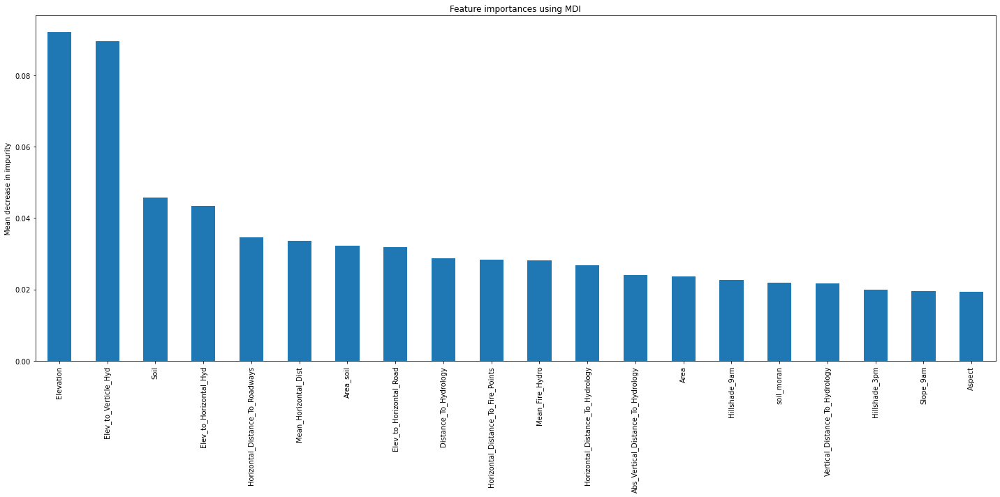

In [55]:
#Importances
importances = clf.feature_importances_
std = np.std([tree.feature_importances_ for tree in clf.estimators_], axis=0)
forest_importances = pd.Series(importances, index=X.columns).sort_values(ascending =False)


fig, ax = plt.subplots(figsize =(20,10))
forest_importances[:20].plot.bar( ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

### Feature Selection with SelectFromModel

In [56]:
"""Because we are using a Random Forest as feature selection algorithm we are going to include the ordinal encoding
and do not include one hot encoded columns (both options are present in the dataset)""" 

cols_fs = cols_numeric + categorical
cols_fs.remove('Cover_Type')
selected_Cols = pd.DataFrame(columns = ['number','cols','accuracy'])
for i in np.arange(0,2.1,0.3):
    
    model_tree = RandomForestClassifier(random_state=100, n_estimators=50)
    model_tree.fit(X_train[cols_fs], y_train)
    tresh = str(i)+'*mean'
    sel_model_tree = SelectFromModel(estimator=model_tree, prefit=True, threshold=tresh)  
    sfm_cols = list(pd.Series(cols_fs)[sel_model_tree.get_support()])
    #Model test
    clf = RandomForestClassifier(random_state=random)
    accuracy = cross_val_score(model_tree,X_train[sfm_cols],y_train, cv=5, scoring ='accuracy')
    selected_Cols.loc[len(selected_Cols)] = [i,sfm_cols,accuracy.mean()]
    print(f'percentage over mean cols:{i}, accuraccy: {accuracy.mean():.4}')

percentage over mean cols:0.0, accuraccy: 0.859
percentage over mean cols:0.3, accuraccy: 0.8615
percentage over mean cols:0.6, accuraccy: 0.8626
percentage over mean cols:0.8999999999999999, accuraccy: 0.8673
percentage over mean cols:1.2, accuraccy: 0.8324
percentage over mean cols:1.5, accuraccy: 0.7812
percentage over mean cols:1.7999999999999998, accuraccy: 0.7812
percentage over mean cols:2.1, accuraccy: 0.7585


### Final Columns

In [57]:
id_max = selected_Cols['accuracy'].idxmax()
best_cols = selected_Cols.loc[id_max,'cols']
best_cols

['Elevation',
 'Horizontal_Distance_To_Roadways',
 'Hillshade_9am',
 'Horizontal_Distance_To_Fire_Points',
 'Area',
 'Soil',
 'Area_soil',
 'Distance_To_Hydrology',
 'Elev_to_Horizontal_Hyd',
 'Elev_to_Horizontal_Road',
 'Elev_to_Verticle_Hyd',
 'Mean_Horizontal_Dist',
 'Mean_Fire_Hydro']

In [58]:
#Changing the selected columns with ordinal encoding to one hot encoded for svm and logit

best_cols2 = [col for col in best_cols if "oil" not in col ]
columns = pd.Series(X_train.columns).astype('str')
var = list(columns[columns.str.contains('Soil_Type')])
var_num = list(columns[columns.str.contains('^[0-9]')].astype('int'))
new_columns_use = var + best_cols2 + var_num

### Feature Creation Validation

In [59]:
#Model from raw data
dat = pd.read_csv('train.csv')
X_ = dat.drop(columns=[target[0],'Id'])
y_ = dat[target[0]]

X_train_,X_test_, y_train_,y_test_ = train_test_split(X_, y_, test_size=0.2, random_state=random)

clf = RandomForestClassifier(random_state=random)
accuracy = cross_val_score(clf,X_train_,y_train_)
print(accuracy.mean(), accuracy)

0.8479666141667721 [0.84380165 0.85489872 0.85241835 0.84084332 0.84787102]


In [60]:
#Model with new features
clf = RandomForestClassifier(random_state=random)
accuracy = cross_val_score(clf,X_train[best_cols],y_train)
print(accuracy.mean(), accuracy)

0.8692129457223974 [0.86942149 0.88466308 0.86647375 0.85696569 0.86854072]


We have improved the model with the new data, and reduced compexity (less columns)

from the 15 columns, 11 were cretions or transformations

## Model Selection and Tunning

### Data Preparation for Modeling

In [61]:
# # Data preparation
# model = data.copy()
# X = model.drop(columns=[target[0]])
# X.columns = X.columns.astype('str')
# y = model[target[0]]
# X_train,X_test, y_train,y_test = train_test_split(X[cols], y, test_size=0.2, random_state=random)

In [62]:
#Scaling
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_Scaled = scaler.transform(X_train)
X_train_Scaled = pd.DataFrame(
    X_train_Scaled,
    columns= X_train.columns,
    index = X_train.index)

If do not want to run the GridSearch for each algo go directly to Final Test section

### Logistic Regression

In [63]:
parameters = {'penalty':('none', 'l2'),
              'C':[1,10],
             'solver': [ 'saga'],
             'multi_class': ['multinomial']}

lm_mod = LogisticRegression(max_iter=10000, random_state = random)
lr_gd = GridSearchCV(lm_mod, parameters, scoring = 'accuracy', cv = 5, verbose = 2)
lr_gd.fit(X_train_Scaled[new_columns_use], y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END C=1, multi_class=multinomial, penalty=none, solver=saga; total time= 4.9min
[CV] END C=1, multi_class=multinomial, penalty=none, solver=saga; total time= 5.4min
[CV] END C=1, multi_class=multinomial, penalty=none, solver=saga; total time= 4.9min
[CV] END C=1, multi_class=multinomial, penalty=none, solver=saga; total time= 5.2min
[CV] END C=1, multi_class=multinomial, penalty=none, solver=saga; total time= 5.2min
[CV] END C=1, multi_class=multinomial, penalty=l2, solver=saga; total time=   4.1s
[CV] END C=1, multi_class=multinomial, penalty=l2, solver=saga; total time=   4.3s
[CV] END C=1, multi_class=multinomial, penalty=l2, solver=saga; total time=   4.1s
[CV] END C=1, multi_class=multinomial, penalty=l2, solver=saga; total time=   4.1s
[CV] END C=1, multi_class=multinomial, penalty=l2, solver=saga; total time=   4.3s


C:\Users\jlbet\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1322: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(


[CV] END C=10, multi_class=multinomial, penalty=none, solver=saga; total time= 5.0min


C:\Users\jlbet\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1322: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(


[CV] END C=10, multi_class=multinomial, penalty=none, solver=saga; total time= 5.2min


C:\Users\jlbet\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1322: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(


[CV] END C=10, multi_class=multinomial, penalty=none, solver=saga; total time= 5.1min


C:\Users\jlbet\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1322: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(


[CV] END C=10, multi_class=multinomial, penalty=none, solver=saga; total time= 5.3min


C:\Users\jlbet\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1322: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(


[CV] END C=10, multi_class=multinomial, penalty=none, solver=saga; total time= 5.1min
[CV] END C=10, multi_class=multinomial, penalty=l2, solver=saga; total time=  17.0s
[CV] END C=10, multi_class=multinomial, penalty=l2, solver=saga; total time=  17.6s
[CV] END C=10, multi_class=multinomial, penalty=l2, solver=saga; total time=  17.6s
[CV] END C=10, multi_class=multinomial, penalty=l2, solver=saga; total time=  16.9s
[CV] END C=10, multi_class=multinomial, penalty=l2, solver=saga; total time=  18.6s


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=10000, random_state=42),
             param_grid={'C': [1, 10], 'multi_class': ['multinomial'],
                         'penalty': ('none', 'l2'), 'solver': ['saga']},
             scoring='accuracy', verbose=2)

### SVM

In [64]:
param_grid = {'C': [ 10, 20, 30],
              'gamma': [0.1],
              'kernel': ['rbf'],
             'decision_function_shape':['ovo']}
 
svm_gd = GridSearchCV(SVC(random_state = random), param_grid, refit = True, verbose = 3)
 
# fitting the model for grid search
svm_gd.fit(X_train_Scaled[new_columns_use], y_train)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5] END C=10, decision_function_shape=ovo, gamma=0.1, kernel=rbf; total time=   5.1s
[CV 2/5] END C=10, decision_function_shape=ovo, gamma=0.1, kernel=rbf; total time=   5.7s
[CV 3/5] END C=10, decision_function_shape=ovo, gamma=0.1, kernel=rbf; total time=   5.1s
[CV 4/5] END C=10, decision_function_shape=ovo, gamma=0.1, kernel=rbf; total time=   5.2s
[CV 5/5] END C=10, decision_function_shape=ovo, gamma=0.1, kernel=rbf; total time=   5.1s
[CV 1/5] END C=20, decision_function_shape=ovo, gamma=0.1, kernel=rbf; total time=   4.8s
[CV 2/5] END C=20, decision_function_shape=ovo, gamma=0.1, kernel=rbf; total time=   4.8s
[CV 3/5] END C=20, decision_function_shape=ovo, gamma=0.1, kernel=rbf; total time=   5.0s
[CV 4/5] END C=20, decision_function_shape=ovo, gamma=0.1, kernel=rbf; total time=   4.9s
[CV 5/5] END C=20, decision_function_shape=ovo, gamma=0.1, kernel=rbf; total time=   5.1s
[CV 1/5] END C=30, decision_function_sha

GridSearchCV(estimator=SVC(random_state=42),
             param_grid={'C': [10, 20, 30], 'decision_function_shape': ['ovo'],
                         'gamma': [0.1], 'kernel': ['rbf']},
             verbose=3)

### Naives Bayes

In [65]:
parameters = {'alpha':[0.001,0.01,0.1],
              'binarize': [0.4,0.5,0.7]
             }

nb = BernoulliNB()
nb_gd = GridSearchCV(nb, parameters,scoring = 'accuracy',cv=5,verbose=2)
nb_gd.fit(X_train_Scaled[best_cols], y_train)


Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] END ..........................alpha=0.001, binarize=0.4; total time=   0.0s
[CV] END ..........................alpha=0.001, binarize=0.4; total time=   0.0s
[CV] END ..........................alpha=0.001, binarize=0.4; total time=   0.0s
[CV] END ..........................alpha=0.001, binarize=0.4; total time=   0.0s
[CV] END ..........................alpha=0.001, binarize=0.4; total time=   0.0s
[CV] END ..........................alpha=0.001, binarize=0.5; total time=   0.0s
[CV] END ..........................alpha=0.001, binarize=0.5; total time=   0.0s
[CV] END ..........................alpha=0.001, binarize=0.5; total time=   0.0s
[CV] END ..........................alpha=0.001, binarize=0.5; total time=   0.0s
[CV] END ..........................alpha=0.001, binarize=0.5; total time=   0.0s
[CV] END ..........................alpha=0.001, binarize=0.7; total time=   0.0s
[CV] END ..........................alpha=0.001, b

GridSearchCV(cv=5, estimator=BernoulliNB(),
             param_grid={'alpha': [0.001, 0.01, 0.1],
                         'binarize': [0.4, 0.5, 0.7]},
             scoring='accuracy', verbose=2)

### Random Forest

In [66]:
# Grid Search CV with X_train and y_train
from sklearn.svm import SVC
parameters = {'n_estimators': [100 ,1000, 2000],
              'max_depth': [5,10, 30],
              "min_samples_leaf":[1,5],
              "random_state" : [random]}
rf = RandomForestClassifier()
rf_gd = GridSearchCV(rf, parameters, verbose=2)
rf_gd.fit(X_train_Scaled[best_cols], y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV] END max_depth=5, min_samples_leaf=1, n_estimators=100, random_state=42; total time=   1.0s
[CV] END max_depth=5, min_samples_leaf=1, n_estimators=100, random_state=42; total time=   0.9s
[CV] END max_depth=5, min_samples_leaf=1, n_estimators=100, random_state=42; total time=   0.9s
[CV] END max_depth=5, min_samples_leaf=1, n_estimators=100, random_state=42; total time=   0.9s
[CV] END max_depth=5, min_samples_leaf=1, n_estimators=100, random_state=42; total time=   0.9s
[CV] END max_depth=5, min_samples_leaf=1, n_estimators=1000, random_state=42; total time=   9.6s
[CV] END max_depth=5, min_samples_leaf=1, n_estimators=1000, random_state=42; total time=   9.3s
[CV] END max_depth=5, min_samples_leaf=1, n_estimators=1000, random_state=42; total time=   9.7s
[CV] END max_depth=5, min_samples_leaf=1, n_estimators=1000, random_state=42; total time=   9.8s
[CV] END max_depth=5, min_samples_leaf=1, n_estimators=1000, random_sta

[CV] END max_depth=30, min_samples_leaf=5, n_estimators=1000, random_state=42; total time=  51.3s
[CV] END max_depth=30, min_samples_leaf=5, n_estimators=2000, random_state=42; total time= 1.8min
[CV] END max_depth=30, min_samples_leaf=5, n_estimators=2000, random_state=42; total time= 1.7min
[CV] END max_depth=30, min_samples_leaf=5, n_estimators=2000, random_state=42; total time= 1.7min
[CV] END max_depth=30, min_samples_leaf=5, n_estimators=2000, random_state=42; total time= 1.7min
[CV] END max_depth=30, min_samples_leaf=5, n_estimators=2000, random_state=42; total time= 1.8min


GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': [5, 10, 30], 'min_samples_leaf': [1, 5],
                         'n_estimators': [100, 1000, 2000],
                         'random_state': [42]},
             verbose=2)

### Xgboost

In [67]:
# # Grid Search CV with X_train and y_train
# parameters = {'subsample':[0.6,0.85],
#               'max_depth':[10,20,30],
#               'n_estimators':[100,1000,2000],
#               'learning_rate':[0.01,0.1],
#               'tree_method': ['hist']
#              }

In [68]:
# Grid Search CV with X_train and y_train
parameters = {'subsample':[0.66,0.85],
              'max_depth':[20,30],
              'n_estimators':[1000,2000],
              'learning_rate':[0.01],
              'tree_method': ['hist']
             }

xgb = XGBClassifier(use_label_encoder=False , objective = 'multi:softmax',
                    num_class=7,eval_metric ='mlogloss', random_state=random )
xgb_gd = GridSearchCV(xgb, parameters,scoring = 'accuracy',cv=5, verbose=2)
xgb_gd.fit(X_train_Scaled[best_cols], y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END learning_rate=0.01, max_depth=20, n_estimators=1000, subsample=0.66, tree_method=hist; total time= 1.6min
[CV] END learning_rate=0.01, max_depth=20, n_estimators=1000, subsample=0.66, tree_method=hist; total time= 1.7min
[CV] END learning_rate=0.01, max_depth=20, n_estimators=1000, subsample=0.66, tree_method=hist; total time= 1.6min
[CV] END learning_rate=0.01, max_depth=20, n_estimators=1000, subsample=0.66, tree_method=hist; total time= 1.6min
[CV] END learning_rate=0.01, max_depth=20, n_estimators=1000, subsample=0.66, tree_method=hist; total time= 1.6min
[CV] END learning_rate=0.01, max_depth=20, n_estimators=1000, subsample=0.85, tree_method=hist; total time= 1.8min
[CV] END learning_rate=0.01, max_depth=20, n_estimators=1000, subsample=0.85, tree_method=hist; total time= 1.9min
[CV] END learning_rate=0.01, max_depth=20, n_estimators=1000, subsample=0.85, tree_method=hist; total time= 1.8min
[CV] END learning_ra

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     enable_categorical=False,
                                     eval_metric='mlogloss', gamma=None,
                                     gpu_id=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, mon...
                                     num_parallel_tree=None,
                                     objective='multi:softmax', predictor=None,
                                     random_state=42, reg_alpha=None,
                                   

In [69]:
model_tuning = pd.DataFrame({'algo':['lr','svm','nb','rf','xgb'],
                            'score': [lr_gd.best_score_,svm_gd.best_score_,nb_gd.best_score_,
                                     rf_gd.best_score_,xgb_gd.best_score_],
                            'params':[lr_gd.best_params_,svm_gd.best_params_,nb_gd.best_params_,
                                     rf_gd.best_params_,xgb_gd.best_params_]})
model_tuning

,algo,score,params
0,lr,0.700893,"{'C': 1, 'multi_class': 'multinomial', 'penalty': 'none', 'solver': 'saga'}"
1,svm,0.751406,"{'C': 30, 'decision_function_shape': 'ovo', 'gamma': 0.1, 'kernel': 'rbf'}"
2,nb,0.514468,"{'alpha': 0.001, 'binarize': 0.7}"
3,rf,0.872272,"{'max_depth': 30, 'min_samples_leaf': 1, 'n_estimators': 1000, 'random_state': 42}"
4,xgb,0.874587,"{'learning_rate': 0.01, 'max_depth': 30, 'n_estimators': 2000, 'subsample': 0.66, 'tree_method': 'hist'}"


### Final Test
Just for the models that perform above 80%, Random Forest and XGBoost

In [70]:
xgb_tunned = XGBClassifier(use_label_encoder=False , objective = 'multi:softmax',
                    num_class=7,eval_metric ='mlogloss', random_state=random,
                    learning_rate= 0.01, max_depth= 30, n_estimators= 2000,
                    subsample= 0.66, tree_method= 'hist')


rf_tunned = RandomForestClassifier(random_state=random,max_depth= 30, min_samples_leaf= 1, n_estimators= 1000 )

In [71]:
X_test_Scaled = scaler.transform(X_test)
X_test_Scaled = pd.DataFrame(
    X_test_Scaled,
    columns= X_test.columns,
    index = X_test.index)

In [72]:
#Models that perform the best!
preds_dic = {}
models = [rf_tunned,xgb_tunned]
for model in models:
    name = re.sub("\n","",str(model))
    name = re.sub("\(.*\)","",str(name))
    model.fit(X_train_Scaled[best_cols], y_train)
    y_pred = model.predict(X_test_Scaled[best_cols])
    accuracy = accuracy_score(y_test,y_pred)
    preds_dic[name]= y_pred
    print(F'{name}: {accuracy}')
        

RandomForestClassifier: 0.8915343915343915
XGBClassifier: 0.8921957671957672


## Final Model

accuracy: 0.892, precision:0.891, recall:0.892


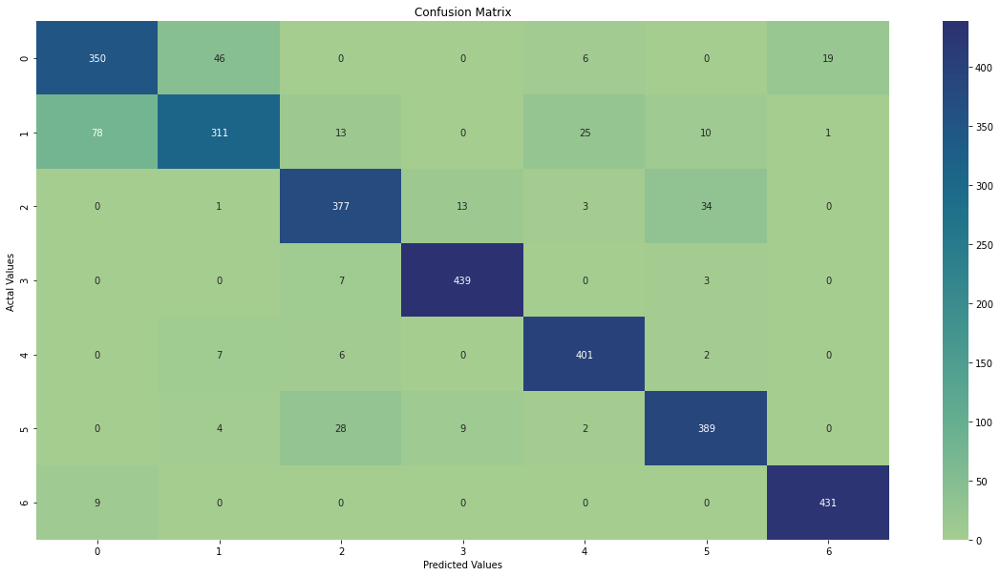

In [73]:
y_pred = preds_dic['XGBClassifier']

accuracy = accuracy_score(y_test,y_pred)
precision = precision_score(y_test,y_pred,average = 'weighted')
recall = recall_score(y_test,y_pred, average = 'weighted')
print(f'accuracy: {accuracy:.3}, precision:{precision:.3}, recall:{recall:.3}')


cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(20,10))
sns.heatmap(cm, annot=True,fmt='g', cmap ='crest')
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()


## Test Set

### Train Model With All the data

In [74]:
pipe = make_pipeline(MinMaxScaler(),xgb_tunned)
pipe.fit(X[best_cols],y)

Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('xgbclassifier',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, enable_categorical=False,
                               eval_metric='mlogloss', gamma=0, gpu_id=-1,
                               importance_type=None, interaction_constraints='',
                               learning_rate=0.01, max_delta_step=0,
                               max_depth=30, min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=2000,
                               n_jobs=8, num_class=7, num_parallel_tree=1,
                               objective='multi:softprob', predictor='auto',
                               random_state=42, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=None, subsample=0.66,
                         

<AxesSubplot:xlabel='Importance', ylabel='features'>

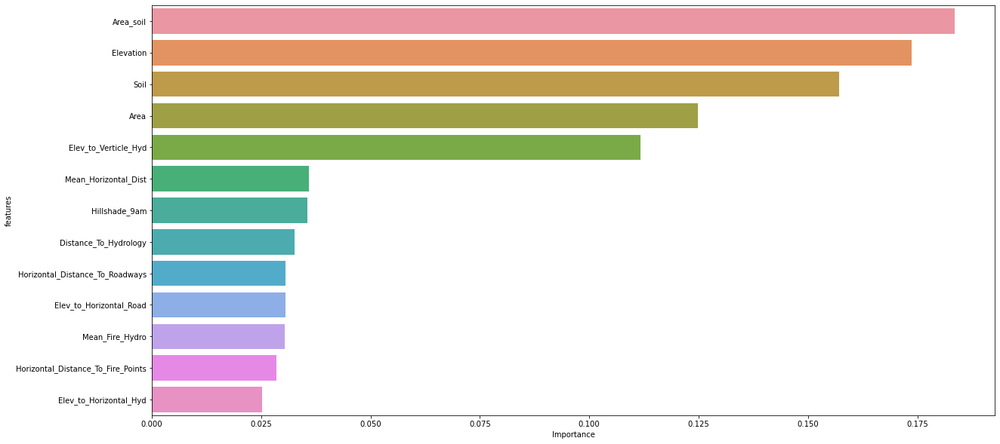

In [104]:
final_model = pipe.steps[1][1]
xgb.plot_importance(final_model)
importance = pd.DataFrame({'features':best_cols,
                    'Importance':final_model.feature_importances_}).sort_values('Importance',ascending=False)

plt = plt.subplots(figsize =(20,10))
sns.barplot(x='Importance',y='features', data = importance)

### Transformations to Test Set

In [75]:
#eliminate id
#test.drop(columns = ["Id"], inplace=True)

#Area and Soil Transformation
col_area = test.reset_index().melt(id_vars='index',value_vars=area)
test['Area'] = col_area.loc[col_area['value']==1,['variable','index']].sort_values('index').set_index('index')
test['Area'] = test['Area'].str.replace("Wilderness_Area","").astype('int')

col_area = test.reset_index().melt(id_vars='index',value_vars=soil)
test['Soil'] = col_area.loc[col_area['value']==1,['variable','index']].sort_values('index').set_index('index')
test['Soil'] = test['Soil'].str.replace("Soil_Type","").astype('int')

test['Area_soil'] = test['Area']*100+test['Soil']



#Variables related to sun
id_min = test['Slope'].min()
hills = ['Hillshade_Noon','Hillshade_3pm','Hillshade_9am']
hills_name = ['Sun_Noon','Sun_3pm','Sun_9am']
slope_sun = ['Slope_Noon','Slope_3pm','Slope_9am']
for hill,name,slope in zip(hills,hills_name,slope_sun):
    minimun = test.loc[id_min,hill]
    test[name] = [1 if dat>minimun else -1 for dat in test[hill]]
    test[slope] = test[name]*test['Slope']
    
#Direct distance to water
test['Distance_To_Hydrology'] = np.sqrt(test['Horizontal_Distance_To_Hydrology']**2+test['Vertical_Distance_To_Hydrology']**2)


#Other Mathematical Transformations
test['Elev_to_Horizontal_Hyd']= (test['Elevation'] - test['Horizontal_Distance_To_Hydrology']) / 2
test['Elev_to_Horizontal_Road']= (test['Elevation'] - test['Horizontal_Distance_To_Roadways']) / 2 
test['Elev_to_Verticle_Hyd']= test['Elevation'] - test['Vertical_Distance_To_Hydrology']
test['Mean_Horizontal_Dist']= (test['Horizontal_Distance_To_Fire_Points'] + test['Horizontal_Distance_To_Hydrology'] + 
                                 test['Horizontal_Distance_To_Roadways'])/3 
test['Mean_Fire_Hydro']= (test['Horizontal_Distance_To_Fire_Points'] + test['Horizontal_Distance_To_Hydrology'])/2


### Fit

In [76]:
real_y_pred = pipe.predict(test[best_cols])

In [77]:
test['Cover_Type'] = real_y_pred+1
test_deliver = test[['Id','Cover_Type']]
test_deliver.to_csv("final_df.csv", index=False)

In [78]:
# Score: 0.79117 Kaggle